In [1]:
cd TileEM/

/Users/dorislee/Desktop/Research/seg/crowd-seg/analysis/TileEM


In [2]:
%pylab inline
%load_ext autoreload
%autoreload 2
from TileEM_plot_toolbox import *

Populating the interactive namespace from numpy and matplotlib


In [3]:
cd output

/Users/dorislee/Desktop/Research/seg/crowd-seg/analysis/TileEM/output


In [4]:
objid=12
worker_ids,worker_precision_lst,worker_recall_lst = compute_worker_PR_obj(objid,return_worker_id=True)

In [5]:
worker_ids

array([  8,   6,  23,  22,  31,  42,  46,  53,  54, 114, 118, 116, 133,
       142, 131, 140, 149, 146, 147, 150, 148, 137, 228, 143,  52, 179,
       161, 170, 156, 181, 135, 219, 218, 192, 225, 230, 234, 233, 235,
       239,   2, 264, 266, 273])

In [6]:
len(worker_recall_lst)

44

In [7]:
cd ../../

/Users/dorislee/Desktop/Research/seg/crowd-seg/analysis


In [9]:
import mpld3
mpld3.enable_notebook()

In [65]:
cd ../../

/Users/dorislee/Desktop/Research/seg/crowd-seg/analysis


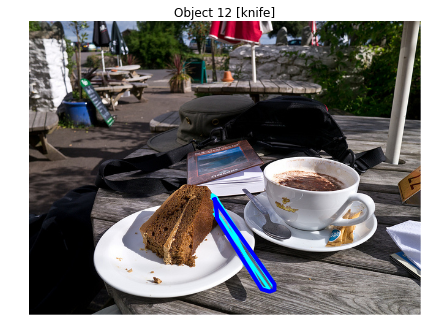

In [10]:
visualize_bb_objects(object_id=12, worker_id=31)

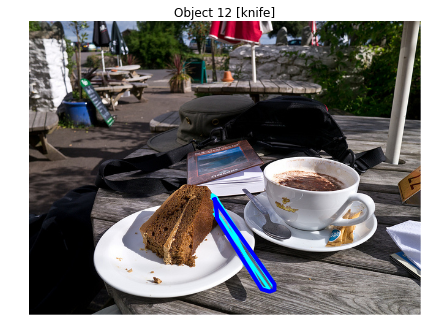

In [8]:
visualize_bb_objects(object_id=12, worker_id=31)

##### precision value exceeds one in the case that the object BB is not closed, to eliminate these cases we enforce precision recall values to lie within [0,1] finding the max. 

In [39]:
objid=12
worker_ids,worker_precision_lst,worker_recall_lst = compute_worker_PR_obj(objid,return_worker_id=True)
filter_idx = np.where((worker_recall_lst>=0)&(worker_recall_lst<=1)&(worker_precision_lst>=0)&(worker_precision_lst<=1))[0]

In [40]:
worker_precision_lst=worker_precision_lst[filter_idx]
worker_recall_lst=worker_recall_lst[filter_idx]
worker_ids=worker_ids[filter_idx]

In [41]:
print np.argmax(worker_recall_lst)
print np.argmax(worker_precision_lst)

39
39


In [47]:
best_worker = np.argmax(worker_recall_lst)

In [48]:
best_worker

39

In [45]:
print max(worker_recall_lst),max(worker_precision_lst)

1.0 1.0


In [54]:
os.chdir("../")
tiles,indicatorMat= createObjIndicatorMatrix(objid)
os.chdir(DATA_DIR)

In [44]:
worker_ids[39]

2

In [56]:
shape(indicatorMat)

(45, 54)

In [62]:
approved_tiles = np.where(indicatorMat[:,39]==1)[0]

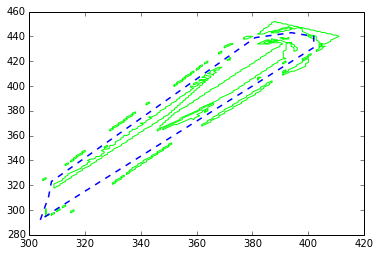

In [83]:
for tidx in approved_tiles:
    plot_coords(Polygon(tiles[tidx]),color="lime")
my_BBG  = pd.read_csv("my_ground_truth.csv")
ground_truth_match = my_BBG[my_BBG.object_id==objid]
x_locs,y_locs =  process_raw_locs([ground_truth_match["x_locs"].iloc[0],ground_truth_match["y_locs"].iloc[0]])
plt.plot(x_locs,y_locs,'--',color='#0000ff',linewidth=1.5)

In [88]:
joined_bb = join_tiles(approved_tiles,tiles)

In [89]:
compute_PR(objid,approved_tiles,tiles)

(0.7208712855882602, 0.2792278538412066)

In [81]:
print precision([tiles[tidx][:,0],x_locs],[tiles[tidx][:,1],y_locs])
print recall([tiles[tidx][:,0],x_locs],[tiles[tidx][:,1],y_locs])

0.0
0.0


### Eliminate non-closed polygon

In [104]:
mpld3.disable_notebook()

In [124]:
len(bb_info)

1947

In [149]:
mpld3.disable_notebook()

KeyboardInterrupt: 

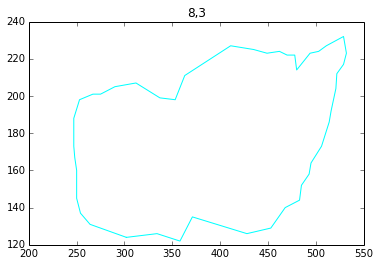

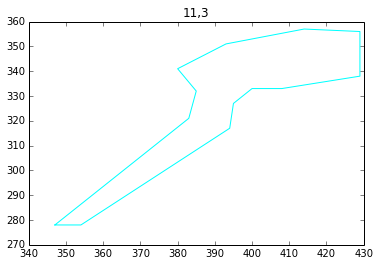

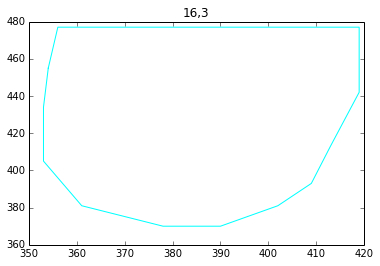

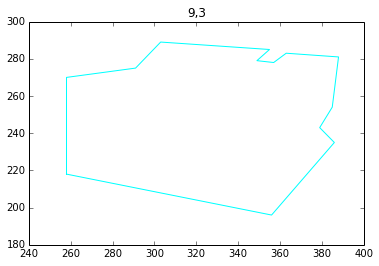

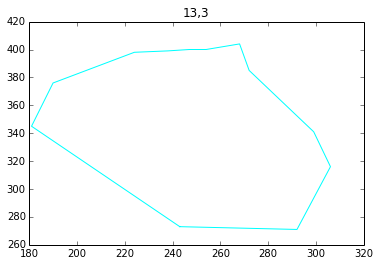

...

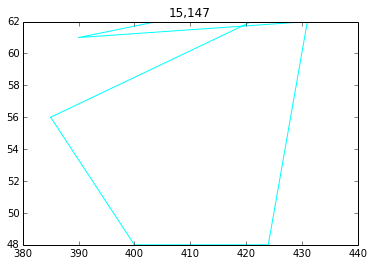

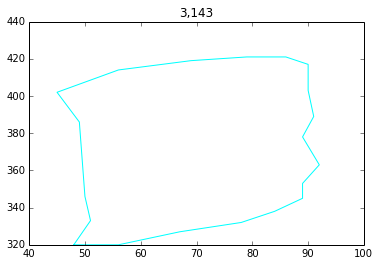

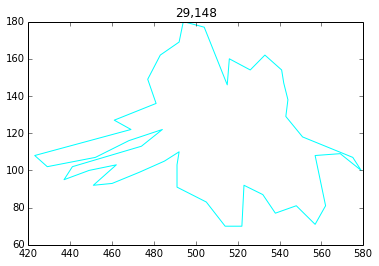

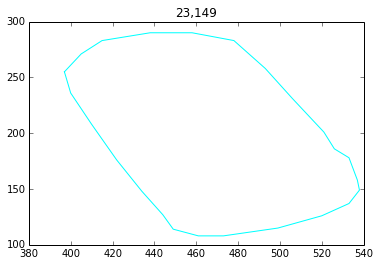

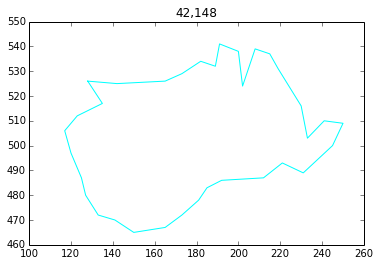

In [150]:
object_id=12
worker_id=31
img_info,object_tbl,bb_info,hit_info=load_info()
# bb_objects = bb_info[bb_info["object_id"]==object_id]
# bb = bb_objects[bb_objects["worker_id"]==worker_id]
for bb in bb_info.iterrows():
    bb=bb[1]
    xloc,yloc =  process_raw_locs([bb["x_locs"],bb["y_locs"]]) 
    worker_BB_polygon=Polygon(zip(xloc,yloc))
    if not (worker_BB_polygon.is_closed and worker_BB_polygon.is_valid):
        plt.figure()
        plt.title("{0},{1}".format(bb["object_id"],bb["worker_id"]))
        plt.plot(xloc,yloc,'-',color='cyan',linewidth=1)

In [135]:
mpld3.enable_notebook()

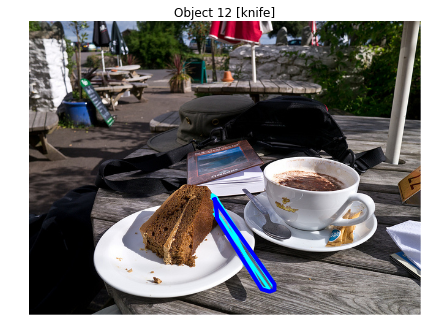

In [136]:
visualize_bb_objects(object_id=12, worker_id=31)

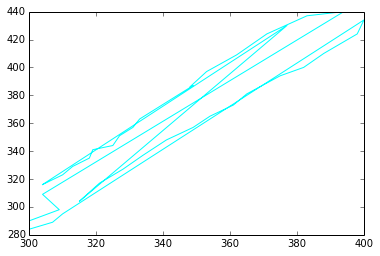

In [143]:
object_id=12
worker_id=31
img_info,object_tbl,bb_info,hit_info=load_info()
bb_objects = bb_info[bb_info["object_id"]==object_id]
bb = bb_objects[bb_objects["worker_id"]==worker_id]
xloc,yloc =  process_raw_locs([bb["x_locs"].iloc[0],bb["y_locs"].iloc[0]])    
worker_BB_polygon=Polygon(zip(xloc,yloc))
plt.plot(xloc,yloc,'-',color='cyan',linewidth=1)
# my_BBG  = pd.read_csv("my_ground_truth.csv")
# ground_truth_match = my_BBG[my_BBG.object_id==object_id]
# x_locs,y_locs =  process_raw_locs([ground_truth_match["x_locs"].iloc[0],ground_truth_match["y_locs"].iloc[0]])
# plt.plot(x_locs,y_locs,'--',color='#0000ff',linewidth=2)

In [144]:
print worker_BB_polygon.is_closed 
print worker_BB_polygon.is_valid

False
False


In [147]:
not (worker_BB_polygon.is_closed  and worker_BB_polygon.is_valid)

True

so worker BB polygon actually have a method for computing centroid, lets see how good this is, maybe its better to use the centroid of tiles to test for containment than to use the heursistics of overalp and things like that 

In [162]:
y,x=worker_BB_polygon.centroid.xy

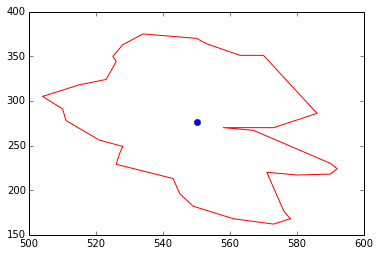

In [163]:
plot_coords(worker_BB_polygon)
plt.plot(x,y,'o')

In [167]:
y,x=worker_BB_polygon.centroid.xy

In [170]:
worker_BB_polygon.contains(worker_BB_polygon.centroid)

True

In [174]:
os.chdir("..")

all unvoted tiles: []
all unvoted workers: []
Object  12
Check that there are no all-zero rows in indicator matrix: True
Check that there are no all-zero columns in indicator matrix: True


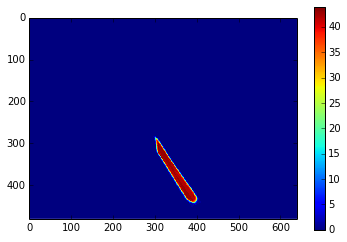

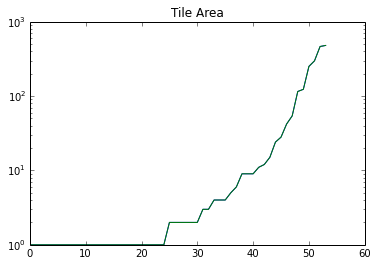

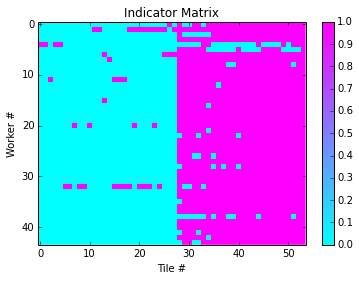

In [175]:
tiles,indicator_matrix = createObjIndicatorMatrix(objid,PLOT=True)

KeyboardInterrupt: 

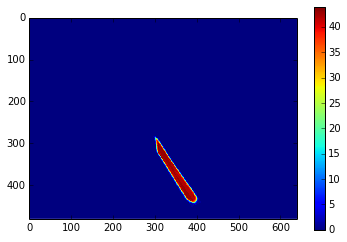

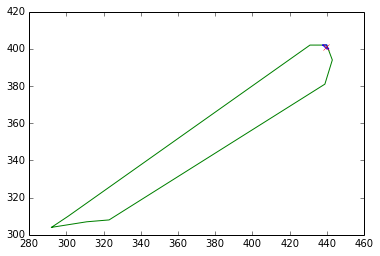

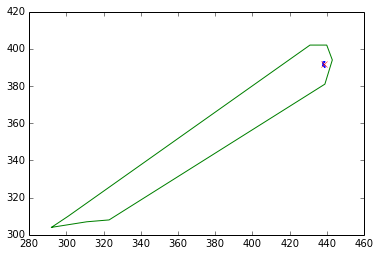

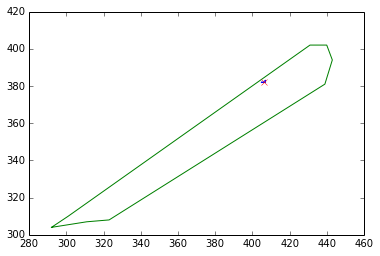

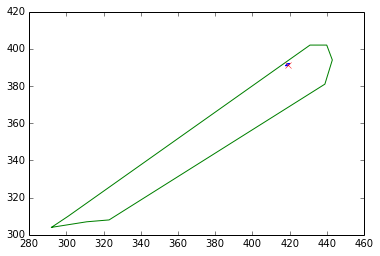

...

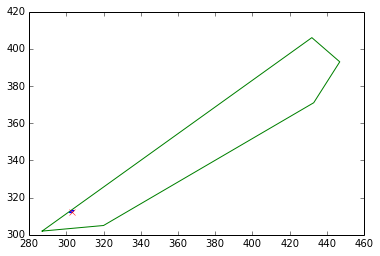

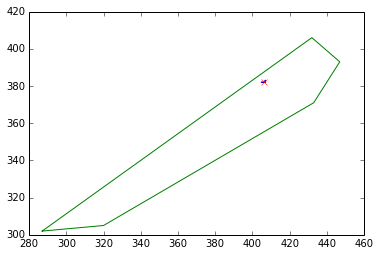

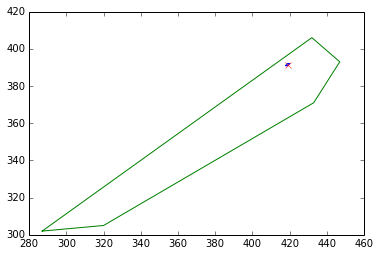

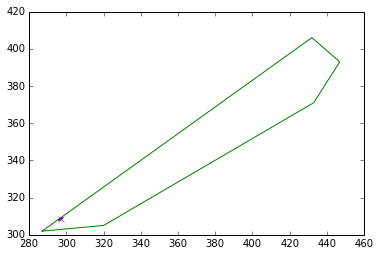

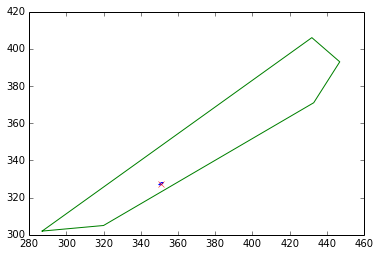

In [183]:
tiles,indicator_matrix = createObjIndicatorMatrix(objid,PLOT=True)

In [218]:
def plot_all_tiles_with_votes(tiles,votes):
    norm = matplotlib.colors.Normalize(
        vmin=np.min(votes),
        vmax=np.max(votes))
    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap=plt.cm.rainbow, norm=norm)
    s_m.set_array([])
    plt.figure()
    for tile,v in zip(tiles,votes):
        plot_coords(Polygon(tile),color=s_m.to_rgba(v))#,fill_color=colors[v])
    plt.gca().invert_yaxis()
    plt.colorbar(s_m)

  7%|▋         | 1/15 [00:03<00:42,  0.33it/s]

Object  1
Object 

 13%|█▎        | 2/15 [00:04<00:30,  0.43it/s]

 2
Object 

 20%|██        | 3/15 [00:05<00:23,  0.52it/s]

 3
Object 

 27%|██▋       | 4/15 [00:06<00:18,  0.59it/s]

 4
Object 

 33%|███▎      | 5/15 [00:08<00:16,  0.61it/s]

 5
Object 

 40%|████      | 6/15 [00:09<00:13,  0.66it/s]

 6
Object 

 47%|████▋     | 7/15 [00:10<00:11,  0.67it/s]

 7
Object 

 53%|█████▎    | 8/15 [00:17<00:15,  0.46it/s]

 8
Object 

 60%|██████    | 9/15 [00:18<00:12,  0.48it/s]

 9
Object 

 67%|██████▋   | 10/15 [00:20<00:10,  0.49it/s]

 10
Object 

 73%|███████▎  | 11/15 [00:21<00:07,  0.51it/s]

 11
Object 

 80%|████████  | 12/15 [00:22<00:05,  0.52it/s]

 12
Object 

 87%|████████▋ | 13/15 [00:24<00:03,  0.53it/s]

 13
Object 

 93%|█████████▎| 14/15 [00:28<00:02,  0.49it/s]

 14
Object 

 15


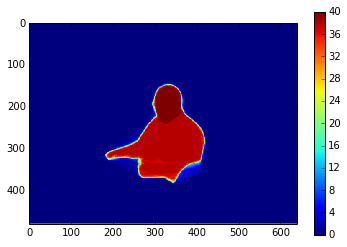

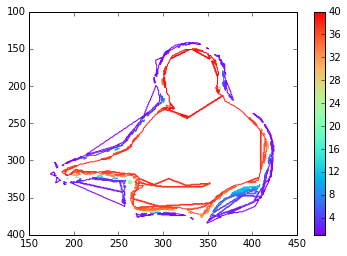

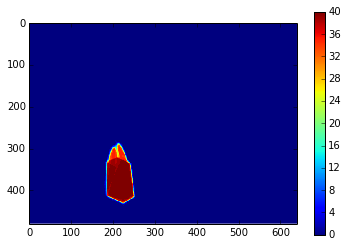

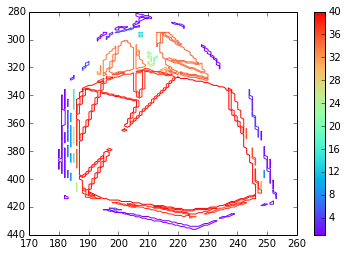

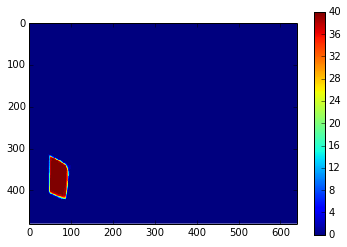

...

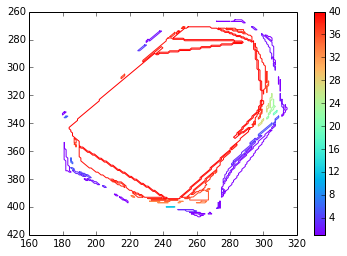

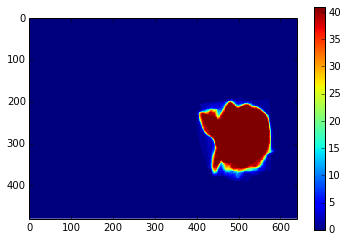

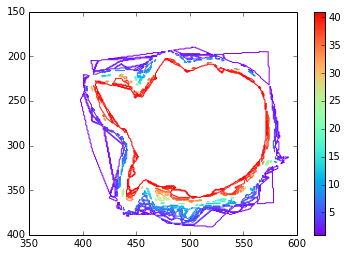

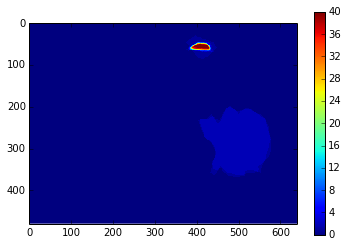

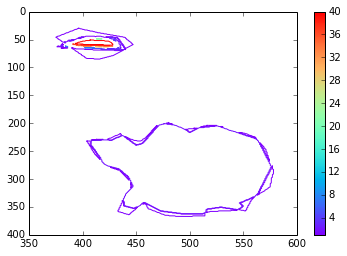

In [223]:
for objid in tqdm(object_lst[:15]):
    tiles,indicator_matrix = createObjIndicatorMatrix(objid,PLOT=True,PRINT=False)
    tile_votes = np.sum(indicator_matrix[:-1],axis=0)
    plot_all_tiles_with_votes(tiles,tile_votes)

The colorbar scale for some reason is wayy off the votes should be artificially set as 35 but it looks more like 5? 

ok now this is fixed, the majority vote count actually looks like the counts in the colormap so there is nothing wrong with the indicator matrix creation process then

removing the tile area <1 constraint and see how its doing 

  0%|          | 0/5 [00:00<?, ?it/s]

Number of non-overlapping tile regions (M) :  4282
Number of workers (N) :  40
all unvoted tiles: [  4   5   6   7   8   9  11  12  13  14  15  20  23  25  26  29  30  31
  32  39  40  41  44  45  46  48  53  55  57  60  61  62  64  68  69  71
  73  74  75  76  77  78  79  80  81  97 108 119 121 171 179 180 182 193
 215 228 230 232]
all unvoted workers: []
After overlap adding

 20%|██        | 1/5 [00:40<02:41,  0.02it/s]


all unvoted tiles: []
all unvoted workers: []
Object  1
Check that there are no all-zero rows in indicator matrix: True
Check that there are no all-zero columns in indicator matrix: True
Number of non-overlapping tile regions (M) :  1473
Number of workers (N) :  40
all unvoted tiles: [  1   2   4   5   6   9  11  12  13  14  16  17  18  19  20  21  22  23
  25  26  27  29  30  31  32  34  35  36  37  38  39  42  43  44  46  47
  48  49  51  52  56  60  66  72  73  75  79  80  81  86  88  89  94 108
 122 148 157 255]
all unvoted workers: []
After overlap adding

 40%|████      | 2/5 [00:53<01:20,  0.04it/s]


all unvoted tiles: []
all unvoted workers: []
Object  2
Check that there are no all-zero rows in indicator matrix: True
Check that there are no all-zero columns in indicator matrix: True
Number of non-overlapping tile regions (M) :  850
Number of workers (N) :  40
all unvoted tiles: [  1   2   3   4   5   7   8   9  10  13  14  17  18  19  21  22  23  27
  29  31  32  34  36  37  38  52  53  55  56  57  63  70  75  79  96 100
 101 102 109 135 139 172]
all unvoted workers: []
After overlap adding

 60%|██████    | 3/5 [01:01<00:40,  0.05it/s]


all unvoted tiles: []
all unvoted workers: []
Object  3
Check that there are no all-zero rows in indicator matrix: True
Check that there are no all-zero columns in indicator matrix: True
Number of non-overlapping tile regions (M) :  1137
Number of workers (N) :  40
all unvoted tiles: [  0   3   4   6   7   8   9  12  13  14  16  17  18  19  20  22  23  24
  27  28  30  31  32  33  34  35  37  38  41  42  43  46  47  48  49  50
  52  53  54  55  57  59  60  61  65  70  75  78  83  89  90  94  96 107
 113 123 161 163 229]
all unvoted workers: []
After overlap adding

 80%|████████  | 4/5 [01:12<00:18,  0.06it/s]


all unvoted tiles: []
all unvoted workers: []
Object  4
Check that there are no all-zero rows in indicator matrix: True
Check that there are no all-zero columns in indicator matrix: True
Number of non-overlapping tile regions (M) :  1459
Number of workers (N) :  40
all unvoted tiles: [  3   4   6   8   9  11  13  14  15  16  20  21  25  28  29  30  33  36
  37  39  41  42  43  45  46  47  48  50  59  62  67  83  94  96  99 128
 224]
all unvoted workers: []
After overlap adding


all unvoted tiles: []
all unvoted workers: []
Object  5
Check that there are no all-zero rows in indicator matrix: True
Check that there are no all-zero columns in indicator matrix: True


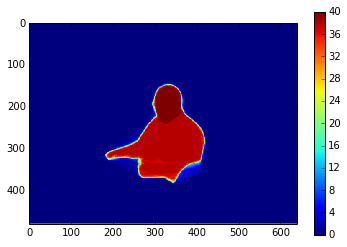

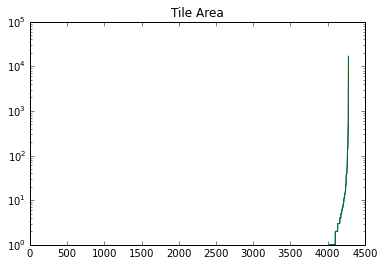

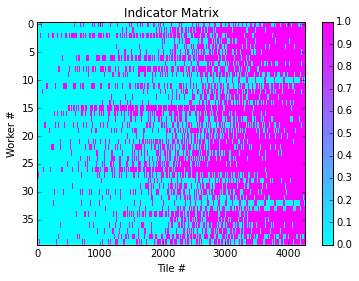

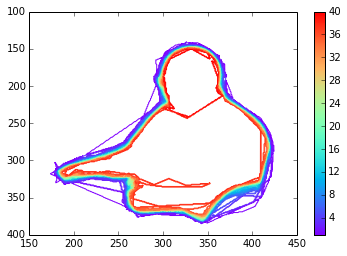

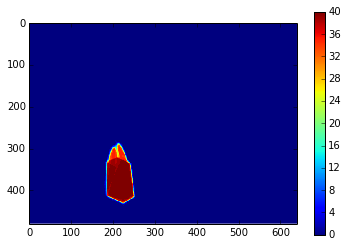

...

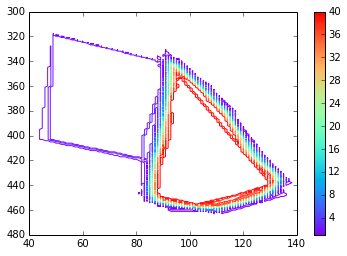

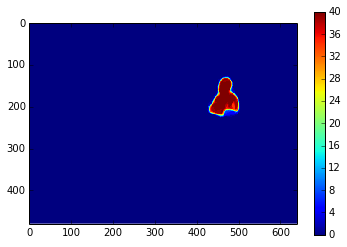

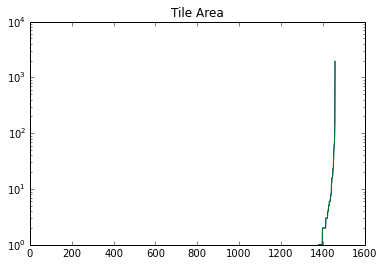

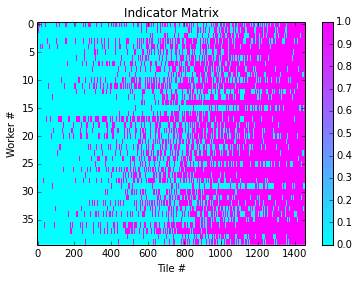

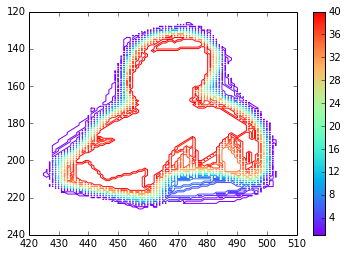

In [224]:
for objid in tqdm(object_lst[:5]):
    tiles,indicator_matrix = createObjIndicatorMatrix(objid,PLOT=True,PRINT=True)
    tile_votes = np.sum(indicator_matrix[:-1],axis=0)
    plot_all_tiles_with_votes(tiles,tile_votes)

In [234]:
cd TileEM/output/

/Users/dorislee/Desktop/Research/seg/crowd-seg/analysis/TileEM/output


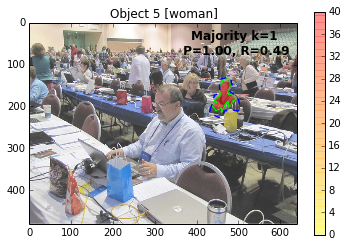

In [236]:
DATA_DIR='output'
os.chdir("..")
tiles, objIndicatorMat = createObjIndicatorMatrix(objid, PRINT=False)
os.chdir(DATA_DIR)

# k_lst = np.arange(1,len(tiles),10)
# for k in tqdm(k_lst):
p,r = compute_PR_obj(objid,0,majority_topk=1,PLOT_HEATMAP='all-regions')

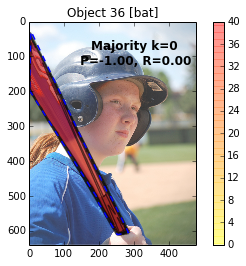

In [237]:
objid=36
p,r = compute_PR_obj(objid,0,majority_topk=0,PLOT_HEATMAP='all-region')

This is now fixed compared to the plot in "2017_03_15_DebugPR_Curves", so we should be able to rerun this whole thing and hopefully the largest tile gets chosen